In [1]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pywt
from scipy.signal import resample

import warnings
warnings.filterwarnings("ignore")


In [ ]:
!pip install --upgrade seaborn

In [ ]:
pip install pycrostates

In [ ]:
!pip install plotly

In [ ]:
!pip install -U kaleido

In [2]:
# Define frequency bands
frequency_bands = {
    # 'delta': (0.5, 4),
    # 'theta': (4, 8),
    # 'alpha': (8, 13),
    'beta': (13, 30),
    # 'gamma': (30, 45)
}

for band_name, (l_freq, h_freq) in frequency_bands.items():
    print(f"{band_name} Band - Low freq = {l_freq} Hz and High freq =  {h_freq} Hz")

beta Band - Low freq = 13 Hz and High freq =  30 Hz


In [3]:
import matplotlib.pyplot as plt
import numpy as np
from mne.io import read_raw_eeglab

from pycrostates.cluster import ModKMeans
from pycrostates.datasets import lemon
from pycrostates.io import ChData
from pycrostates.preprocessing import extract_gfp_peaks, resample

In [4]:
import numpy as np
import pandas as pd
import plotly.express as px
import mne

# Load the EEG data from EEGLAB .set format
eeg_file = "/kaggle/input/alzheimerderivatives/sub-006_task-eyesclosed_eeg.set"
raw = mne.io.read_raw_eeglab(eeg_file, preload=True)
raw.crop(30, 38)

# Get EEG channel names and data
ch_names = raw.ch_names
n_channels = len(ch_names)
eeg_data = raw.get_data()  # EEG values in µV
times = raw.times

# Convert EEG data to DataFrame for Plotly Express
df = pd.DataFrame(eeg_data.T, columns=ch_names)  # Transpose to match (time, channels)
df["Time"] = times  # Add time column

# Melt DataFrame to long format for Plotly Express
df_melted = df.melt(id_vars=["Time"], var_name="Channel", value_name="Amplitude")

# Define a scaling factor to avoid overlap while keeping values in microvolt range
scaling_factor = 1  # Adjust if needed

# Add channel-wise offsets
channel_offsets = {ch: i * (100e-6) for i, ch in enumerate(ch_names)}
df_melted["Offset"] = df_melted["Channel"].map(channel_offsets)
df_melted["Amplitude"] += df_melted["Offset"]  # Apply offsets

# Plot using Plotly Express
fig = px.line(
    df_melted,
    x="Time",
    y="Amplitude",
    color="Channel",
    title="EEG Signal Visualization (µV)",
    labels={"Time": "Time (s)", "Amplitude": "EEG Amplitude (µV)"},
    template="plotly_white"
)

# Reduce line width
fig.update_traces(line=dict(width=0.9))  # Decrease line width

# Update layout for better visualization
fig.update_layout(
    height=800,
    width=1000,
    showlegend=False,
    xaxis=dict(
        showgrid=False,
        zeroline=True,
        zerolinewidth=1,
        zerolinecolor="black",
        range=[times[0], times[-1]],
        tickfont=dict(size=17),
        title=dict(
            # text="X Axis Title",  # Replace with your x-axis title
            font=dict(size=18)  # Adjust the font size for x-axis title
        )
    ),
    yaxis=dict(
        showgrid=False,
        zeroline=False,
        zerolinewidth=1,
        zerolinecolor="black",
        showticklabels=False,
        range=[-150e-6, +2000e-6],
        tickfont=dict(size=17),
        title=dict(
            # text="X Axis Title",  # Replace with your x-axis title
            font=dict(size=18)  # Adjust the font size for x-axis title
        )
    )
)
# ✅ Add annotations for 0 µV, +100 µV, -100 µV on the first EEG channel
first_channel = ch_names[0]  # Get first EEG channel
x_pos = df["Time"].min()  # Get first time value (where the red mark is)

# Y-values to highlight
y_values = [0, 100e-6, -100e-6]  # 0 µV, +100 µV, -100 µV

# Add annotations
for y_val in y_values:
    fig.add_annotation(
        x=x_pos,
        y=y_val,
        text=f"{y_val * 1e6:.0f} µV",  # Convert to µV for readability
        showarrow=True,
        arrowhead=2,
        ax=-40, ay=0  # Adjust arrow position
    )


# ✅ Add labels for each channel on the right side
for i, ch_name in enumerate(ch_names):
    fig.add_annotation(
        x=times[-1],  # Place at the last time value (right side)
        y=channel_offsets[ch_name],  # Use the corresponding offset
        text=ch_name,
        showarrow=False,
        font=dict(size=18, color="black"),
        xshift=20 # Shift text slightly to the right
    )

# Show plot
fig.show()

# Save the plot as a high-resolution PNG
fig.write_image("eeg_plot.png", scale=2)


In [5]:
import numpy as np
import pandas as pd
import plotly.express as px
import mne

# Load the EEG data from EEGLAB .set format
eeg_file = "/kaggle/input/alzheimerderivatives/sub-006_task-eyesclosed_eeg.set"
raw = mne.io.read_raw_eeglab(eeg_file, preload=True)
raw.set_eeg_reference("average")
# raw.filter(13, 30, fir_design='firwin', verbose=False)  # Beta
raw.crop(30, 34)

# Get EEG channel names and data
ch_names = raw.ch_names
n_channels = len(ch_names)
eeg_data = raw.get_data()  # EEG values in µV
times = raw.times

# Convert EEG data to DataFrame for Plotly Express
df = pd.DataFrame(eeg_data.T, columns=ch_names)  # Transpose to match (time, channels)
df["Time"] = times  # Add time column

# Melt DataFrame to long format for Plotly Express
df_melted = df.melt(id_vars=["Time"], var_name="Channel", value_name="Amplitude")

# Define a scaling factor to avoid overlap while keeping values in microvolt range
scaling_factor = 1  # Adjust if needed

# Add channel-wise offsets
channel_offsets = {ch: i * (50e-6) for i, ch in enumerate(ch_names)}
df_melted["Offset"] = df_melted["Channel"].map(channel_offsets)
df_melted["Amplitude"] += df_melted["Offset"]  # Apply offsets

# Plot using Plotly Express
fig = px.line(
    df_melted,
    x="Time",
    y="Amplitude",
    color="Channel",
    title="EEG Signal Visualization (µV) Common Average Referencing (CAR)",
    labels={"Time": "Time (s)", "Amplitude": "EEG Amplitude (µV)"},
    template="plotly_white"
)

# Reduce line width
fig.update_traces(line=dict(width=0.9))  # Decrease line width

fig.update_layout(
    height=800,
    width=1000,
    showlegend=False,
    xaxis=dict(
        showgrid=False,
        zeroline=True,
        zerolinewidth=1,
        zerolinecolor="black",
        range=[times[0], times[-1]],
        tickfont=dict(size=17),
        title=dict(
            # text="X Axis Title",  # Replace with your x-axis title
            font=dict(size=18)  # Adjust the font size for x-axis title
        )
    ),
    yaxis=dict(
        showgrid=False,
        zeroline=False,
        zerolinewidth=1,
        zerolinecolor="black",
        showticklabels=False,
        range=[-50e-6, +950e-6],
        tickfont=dict(size=17),
        title=dict(
            # text="X Axis Title",  # Replace with your x-axis title
            font=dict(size=18)  # Adjust the font size for x-axis title
        )
    )
)
# ✅ Add annotations for 0 µV, +100 µV, -100 µV on the first EEG channel
first_channel = ch_names[0]  # Get first EEG channel
x_pos = df["Time"].min()  # Get first time value (where the red mark is)

# Y-values to highlight
y_values = [0, 30e-6, -30e-6]  # 0 µV, +100 µV, -100 µV

# Add annotations
for y_val in y_values:
    fig.add_annotation(
        x=x_pos,
        y=y_val,
        text=f"{y_val * 1e6:.0f} µV",  # Convert to µV for readability
        showarrow=True,
        arrowhead=2,
        ax=-40, ay=0  # Adjust arrow position
    )


# ✅ Add labels for each channel on the right side
for i, ch_name in enumerate(ch_names):
    fig.add_annotation(
        x=times[-1],  # Place at the last time value (right side)
        y=channel_offsets[ch_name],  # Use the corresponding offset
        text=ch_name,
        showarrow=False,
        font=dict(size=18, color="black"),
        xshift=20 # Shift text slightly to the right
    )

# Show plot
fig.show()

# Save the plot as a high-resolution PNG
fig.write_image("eeg_plot_CAR.png", scale=2)


EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


In [6]:
import numpy as np
import plotly.graph_objects as go
import plotly.express as px
import mne

# Load the EEG data from EEGLAB .set format
eeg_file = "/kaggle/input/alzheimerderivatives/sub-006_task-eyesclosed_eeg.set"
raw = mne.io.read_raw_eeglab(eeg_file, preload=True)
raw.crop(0, 25)  # Crop data from 0 to 50 seconds

# Get EEG channel names and data
ch_names = raw.ch_names
n_channels = len(ch_names)
eeg_data = raw.get_data()
times = raw.times

# Normalize each channel
eeg_data = (eeg_data - np.mean(eeg_data, axis=1, keepdims=True)) / np.std(eeg_data, axis=1, keepdims=True)

# Create the figure
fig = go.Figure()

# Scaling factor for better spacing
scaling_factor = 5  # Adjust if needed

# Assign different colors for each channel
colors = px.colors.qualitative.Safe  # Use Plotly's qualitative color scheme

# Store y-position for annotation
y_positions = []

for i in range(n_channels):
    y_pos = i * 15  # Calculate the y position
    y_positions.append(y_pos)

    # Add EEG signal trace
    fig.add_trace(go.Scatter(
        x=times, 
        y=(eeg_data[i] * scaling_factor + y_pos) + 17,  # Offset each signal for visibility
        mode='lines',
        name=ch_names[i],
        line=dict(color=colors[i % len(colors)], width=0.8),  # Set line width to 0.8
        showlegend=False  # Hide default legend
    ))

# Add labels for each channel on the right
for i, ch_name in enumerate(ch_names):
    fig.add_annotation(
        x=times[0],  # Place at the last time value (right side)
        y=y_positions[i] + 17,
        text=ch_name,
        showarrow=False,
        font=dict(size=15, color=colors[i % len(colors)]),
        xshift=-20  # Shift text slightly to the right
    )

# Add vertical black lines at every 5-second interval
for t in range(5, 51, 5):  # From 5s to 50s in steps of 5
    fig.add_shape(
        go.layout.Shape(
            type="line",
            x0=t, x1=t,
            y0=min(y_positions) - 5, y1=max(y_positions) + 30,  # Extend line across the plot
            line=dict(color="black", width=2, dash="dot")  # Dashed black line
        )
    )

# Update layout with bold black zero lines
fig.update_layout(
    title="EEG Signal Visualization (0-50s)",
    xaxis_title="Time (s)",
    # yaxis_title="EEG Amplitude (µV, scaled)",
    xaxis=dict(
        showgrid=True,
        zeroline=True,
        zerolinewidth=1,  # Make zero line bold
        zerolinecolor="black",  # Set zero line color to black
        range=[times[0], times[-1]],
        tickmode="array",
        tickvals=list(range(0, 55, 5))  # Tick marks at every 5 seconds
    ),
    yaxis=dict(
        showgrid=False,
        zeroline=True,
        zerolinewidth=1,  # Make zero line bold
        zerolinecolor="black",  # Set zero line color to black
        showticklabels=False
    ),
    template="plotly_white",
    height=800,
    width=1000
)

# Show plot
fig.show()

# Save the plot as a high-resolution PNG
fig.write_image("segment_eeg_plot.png", scale=2)


In [7]:
import numpy as np
import plotly.graph_objects as go
import plotly.express as px
import mne

# Load the EEG data from EEGLAB .set format
eeg_file = "/kaggle/input/alzheimerderivatives/sub-006_task-eyesclosed_eeg.set"
raw = mne.io.read_raw_eeglab(eeg_file, preload=True)
raw.crop(0, 10)
raw.set_eeg_reference("average")

# Get EEG channel names and data
ch_names = raw.ch_names
n_channels = len(ch_names)
eeg_data = raw.get_data()
times = raw.times

# Normalize each channel
eeg_data = (eeg_data - np.mean(eeg_data, axis=1, keepdims=True)) / np.std(eeg_data, axis=1, keepdims=True)

# Create the figure
fig = go.Figure()

# Scaling factor for better spacing
scaling_factor = 3 # Adjust if needed

# Assign different colors for each channel
colors = px.colors.qualitative.Set2  # Use Plotly's qualitative color scheme

# Store y-position for annotation
y_positions = []

for i in range(n_channels):
    y_pos = i * 15  # Calculate the y position
    y_positions.append(y_pos)

    # Add EEG signal trace
    fig.add_trace(go.Scatter(
        x=times, 
        y=(eeg_data[i] * scaling_factor + y_pos)+17,  # Offset each signal for visibility
        mode='lines',
        name=ch_names[i],
        line=dict(color=colors[i % len(colors)], width=0.8),  # Set line width to 0.8
        # opacity=0.7,  # Set transparency to 70%
        showlegend=False  # Hide default legend
    ))

# Add labels for each channel on the right
for i, ch_name in enumerate(ch_names):
    fig.add_annotation(
        x=times[0],  # Place at the last time value (right side)
        y=y_positions[i]+17,
        text=ch_name,
        showarrow=False,
        font=dict(size=15, color=colors[i % len(colors)]),
        xshift=-20  # Shift text slightly to the right
    )

# Update layout with bold black zero lines
fig.update_layout(
    title="EEG Signal Visualization Taking CAR",
    xaxis_title="Time (s)",
    yaxis_title="EEG Amplitude (µV, scaled)",
    xaxis=dict(
        showgrid=True,
        zeroline=True,
        zerolinewidth=1,  # Make zero line bold
        zerolinecolor="black",  # Set zero line color to black
        range=[times[0], times[-1]]
    ),
    yaxis=dict(
        showgrid=False,
        zeroline=True,
        zerolinewidth=1,  # Make zero line bold
        zerolinecolor="black",  # Set zero line color to black
        showticklabels=False,
        title=dict(
            text="EEG Amplitude (µV, scaled)",
            standoff=50  # Increase this value to move the title further left
        )
    ),
    template="plotly_white",
    height=800,
    width=1000
)


# Show plot
fig.show()
# Save the plot as a high-resolution PNG
# fig.write_image("eeg_plot_CAR.png", scale=2)


EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


In [8]:
import numpy as np
import pandas as pd
import plotly.express as px
import mne

# Load EEG data and preprocess
raw = mne.io.read_raw_eeglab("/kaggle/input/alzheimerderivatives/sub-006_task-eyesclosed_eeg.set", preload=True)
raw.pick_channels(['C4']).crop(50, 60)

# Prepare DataFrame for Plotly Express
df = pd.DataFrame(raw.get_data().T, columns=raw.ch_names)
df["Time"] = raw.times
df_melted = df.melt(id_vars=["Time"], var_name="Channel", value_name="Amplitude")

# Apply scaling factor and offsets
scaling_factor = 0.3
channel_offsets = {ch: i * (100e-6) for i, ch in enumerate(raw.ch_names)}
df_melted["Amplitude"] = df_melted["Amplitude"] * scaling_factor + df_melted["Channel"].map(channel_offsets)

# Plot
fig = px.line(df_melted, x="Time", y="Amplitude", color="Channel", labels={"Time": "Time (s)", "Amplitude": "Raw"}, template="plotly_white")
fig.update_traces(line=dict(width=0.9, color='#000000'))
fig.update_layout(
    height=800, width=1000, showlegend=False,
    xaxis=dict(showgrid=False, zeroline=False, range=[raw.times[0], raw.times[-1]], tickfont=dict(size=17),title=dict(font=dict(size=18))),
    yaxis=dict(showgrid=False, zeroline=False, range=[-100e-6, 100e-6], tickfont=dict(size=17), showticklabels=False,title=dict(font=dict(size=18))),
)

# Add channel labels
for i, ch_name in enumerate(raw.ch_names):
    fig.add_annotation(x=raw.times[-1], y=channel_offsets[ch_name], text=ch_name, showarrow=False, font=dict(size=18), xshift=20)

# Show and save plot
fig.show()
fig.write_image("RAW_c4.png", scale=2)


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


In [9]:
import numpy as np
import pandas as pd
import plotly.express as px
import mne

# Load EEG data and preprocess
raw = mne.io.read_raw_eeglab("/kaggle/input/alzheimerderivatives/sub-006_task-eyesclosed_eeg.set", preload=True)
raw.set_eeg_reference("average")
raw.filter(0.5, 4, fir_design='firwin', verbose=False)
raw.pick_channels(['C4']).crop(50, 60)

# Prepare DataFrame for Plotly Express
df = pd.DataFrame(raw.get_data().T, columns=raw.ch_names)
df["Time"] = raw.times
df_melted = df.melt(id_vars=["Time"], var_name="Channel", value_name="Amplitude")

# Apply scaling factor and offsets
scaling_factor = 3
channel_offsets = {ch: i * (100e-6) for i, ch in enumerate(raw.ch_names)}
df_melted["Amplitude"] = df_melted["Amplitude"] * scaling_factor + df_melted["Channel"].map(channel_offsets)

# Plot
fig = px.line(df_melted, x="Time", y="Amplitude", color="Channel", labels={"Time": "Time (s)", "Amplitude": "Delta"}, template="plotly_white")
fig.update_traces(line=dict(width=1.2, color='#E17564'))
fig.update_layout(
    height=800, width=1000, showlegend=False,
    xaxis=dict(showgrid=False, zeroline=False, range=[raw.times[0], raw.times[-1]], tickfont=dict(size=17),title=dict(font=dict(size=18))),
    yaxis=dict(showgrid=False, zeroline=False, range=[-100e-6, 100e-6], tickfont=dict(size=17), showticklabels=False,title=dict(font=dict(size=18))),
)

# Add channel labels
for i, ch_name in enumerate(raw.ch_names):
    fig.add_annotation(x=raw.times[-1], y=channel_offsets[ch_name], text=ch_name, showarrow=False, font=dict(size=18), xshift=20)

# Show and save plot
fig.show()
fig.write_image("Delta_c4.png", scale=2)

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


In [10]:
import numpy as np
import pandas as pd
import plotly.express as px
import mne

# Load EEG data and preprocess
raw = mne.io.read_raw_eeglab("/kaggle/input/alzheimerderivatives/sub-006_task-eyesclosed_eeg.set", preload=True)
raw.set_eeg_reference("average")
raw.filter(4, 8, fir_design='firwin', verbose=False)
raw.pick_channels(['C4']).crop(50, 60)

# Prepare DataFrame for Plotly Express
df = pd.DataFrame(raw.get_data().T, columns=raw.ch_names)
df["Time"] = raw.times
df_melted = df.melt(id_vars=["Time"], var_name="Channel", value_name="Amplitude")

# Apply scaling factor and offsets
scaling_factor = 6
channel_offsets = {ch: i * (100e-6) for i, ch in enumerate(raw.ch_names)}
df_melted["Amplitude"] = df_melted["Amplitude"] * scaling_factor + df_melted["Channel"].map(channel_offsets)

# Plot
fig = px.line(df_melted, x="Time", y="Amplitude", color="Channel", labels={"Time": "Time (s)", "Amplitude": "Theta"}, template="plotly_white")
fig.update_traces(line=dict(width=1.2, color='#65bc58'))
fig.update_layout(
    height=800, width=1000, showlegend=False,
    xaxis=dict(showgrid=False, zeroline=False, range=[raw.times[0], raw.times[-1]], tickfont=dict(size=17),title=dict(font=dict(size=18))),
    yaxis=dict(showgrid=False, zeroline=False, range=[-100e-6, 100e-6], tickfont=dict(size=17), showticklabels=False,title=dict(font=dict(size=18))),
)

# Add channel labels
for i, ch_name in enumerate(raw.ch_names):
    fig.add_annotation(x=raw.times[-1], y=channel_offsets[ch_name], text=ch_name, showarrow=False, font=dict(size=18), xshift=20)

# Show and save plot
fig.show()
fig.write_image("Theta_c4.png", scale=2)

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


In [11]:
import numpy as np
import pandas as pd
import plotly.express as px
import mne

# Load EEG data and preprocess
raw = mne.io.read_raw_eeglab("/kaggle/input/alzheimerderivatives/sub-006_task-eyesclosed_eeg.set", preload=True)
raw.set_eeg_reference("average")
raw.filter(8, 13, fir_design='firwin', verbose=False)  # Beta
raw.pick_channels(['C4']).crop(50, 60)

# Prepare DataFrame for Plotly Express
df = pd.DataFrame(raw.get_data().T, columns=raw.ch_names)
df["Time"] = raw.times
df_melted = df.melt(id_vars=["Time"], var_name="Channel", value_name="Amplitude")

# Apply scaling factor and offsets
scaling_factor = 2.8
channel_offsets = {ch: i * (100e-6) for i, ch in enumerate(raw.ch_names)}
df_melted["Amplitude"] = df_melted["Amplitude"] * scaling_factor + df_melted["Channel"].map(channel_offsets)

# Plot
fig = px.line(df_melted, x="Time", y="Amplitude", color="Channel", labels={"Time": "Time (s)", "Amplitude": "Alpha"}, template="plotly_white")
fig.update_traces(line=dict(width=1.2, color='#2973B2'))
fig.update_layout(
    height=800, width=1000, showlegend=False,
    xaxis=dict(showgrid=False, zeroline=False, range=[raw.times[0], raw.times[-1]], tickfont=dict(size=17),title=dict(font=dict(size=18))),
    yaxis=dict(showgrid=False, zeroline=False, range=[-100e-6, 100e-6], tickfont=dict(size=17), showticklabels=False,title=dict(font=dict(size=18))),
)

# Add channel labels
for i, ch_name in enumerate(raw.ch_names):
    fig.add_annotation(x=raw.times[-1], y=channel_offsets[ch_name], text=ch_name, showarrow=False, font=dict(size=18), xshift=20)

# Show and save plot
fig.show()
fig.write_image("Alpha_c4.png", scale=2)

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


In [12]:
import numpy as np
import pandas as pd
import plotly.express as px
import mne

# Load EEG data and preprocess
raw = mne.io.read_raw_eeglab("/kaggle/input/alzheimerderivatives/sub-006_task-eyesclosed_eeg.set", preload=True)
raw.set_eeg_reference("average")
raw.filter(13, 30, fir_design='firwin', verbose=False)  # Beta
raw.pick_channels(['C4']).crop(50, 60)

# Prepare DataFrame for Plotly Express
df = pd.DataFrame(raw.get_data().T, columns=raw.ch_names)
df["Time"] = raw.times
df_melted = df.melt(id_vars=["Time"], var_name="Channel", value_name="Amplitude")

# Apply scaling factor and offsets
scaling_factor = 2.3
channel_offsets = {ch: i * (100e-6) for i, ch in enumerate(raw.ch_names)}
df_melted["Amplitude"] = df_melted["Amplitude"] * scaling_factor + df_melted["Channel"].map(channel_offsets)

# Plot
fig = px.line(df_melted, x="Time", y="Amplitude", color="Channel", labels={"Time": "Time (s)", "Amplitude": "Beta"}, template="plotly_white")
fig.update_traces(line=dict(width=1.2, color='#34d6d7'))
fig.update_layout(
    height=800, width=1000, showlegend=False,
    xaxis=dict(showgrid=False, zeroline=False, range=[raw.times[0], raw.times[-1]], tickfont=dict(size=17),title=dict(font=dict(size=18))),
    yaxis=dict(showgrid=False, zeroline=False, range=[-100e-6, 100e-6], tickfont=dict(size=17), showticklabels=False,title=dict(font=dict(size=18))),
)

# Add channel labels
for i, ch_name in enumerate(raw.ch_names):
    fig.add_annotation(x=raw.times[-1], y=channel_offsets[ch_name], text=ch_name, showarrow=False, font=dict(size=18), xshift=20)

# Show and save plot
fig.show()
fig.write_image("Beta_c4.png", scale=2)

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


In [13]:
import numpy as np
import pandas as pd
import plotly.express as px
import mne

# Load EEG data and preprocess
raw = mne.io.read_raw_eeglab("/kaggle/input/alzheimerderivatives/sub-006_task-eyesclosed_eeg.set", preload=True)
raw.set_eeg_reference("average")
raw.filter(30, 45, fir_design='firwin', verbose=False)  # Beta
raw.pick_channels(['C4']).crop(50, 60)

# Prepare DataFrame for Plotly Express
df = pd.DataFrame(raw.get_data().T, columns=raw.ch_names)
df["Time"] = raw.times
df_melted = df.melt(id_vars=["Time"], var_name="Channel", value_name="Amplitude")

# Apply scaling factor and offsets
scaling_factor = 5
channel_offsets = {ch: i * (100e-6) for i, ch in enumerate(raw.ch_names)}
df_melted["Amplitude"] = df_melted["Amplitude"] * scaling_factor + df_melted["Channel"].map(channel_offsets)

# Plot
fig = px.line(df_melted, x="Time", y="Amplitude", color="Channel", labels={"Time": "Time (s)", "Amplitude": "Gamma"}, template="plotly_white")
fig.update_traces(line=dict(width=1.2, color='#b563c0'))
fig.update_layout(
    height=800, width=1000, showlegend=False,
    xaxis=dict(showgrid=False, zeroline=False, range=[raw.times[0], raw.times[-1]], tickfont=dict(size=17),title=dict(font=dict(size=18))),
    yaxis=dict(showgrid=False, zeroline=False, range=[-100e-6, 100e-6], tickfont=dict(size=17), showticklabels=False,title=dict(font=dict(size=18))),
)

# Add channel labels
for i, ch_name in enumerate(raw.ch_names):
    fig.add_annotation(x=raw.times[-1], y=channel_offsets[ch_name], text=ch_name, showarrow=False, font=dict(size=18), xshift=20)

# Show and save plot
fig.show()
fig.write_image("Gamma_c4.png", scale=2)

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


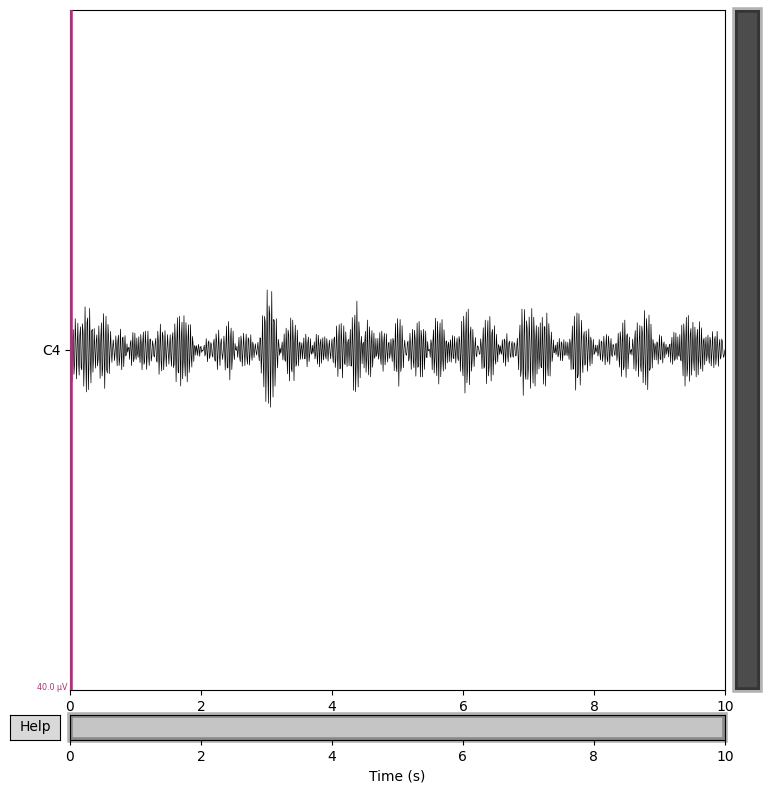

In [15]:
raw.filter(l_freq, h_freq, fir_design='firwin', verbose=False)  # Beta
fig_beta= raw.plot();

fig_beta.set_size_inches(12, 8)  # Width: 12 inches, Height: 8 inches (adjust as needed)

# Save the plot to a file
fig_beta.savefig("RAW_EEG_BETA_AD_1.png", dpi=300)  # Save with high resolution (300 dpi)

Channel names: ['Fp1', 'Fp2', 'F3', 'F4', 'C3', 'C4', 'P3', 'P4', 'O1', 'O2', 'F7', 'F8', 'T3', 'T4', 'T5', 'T6', 'Fz', 'Cz', 'Pz']


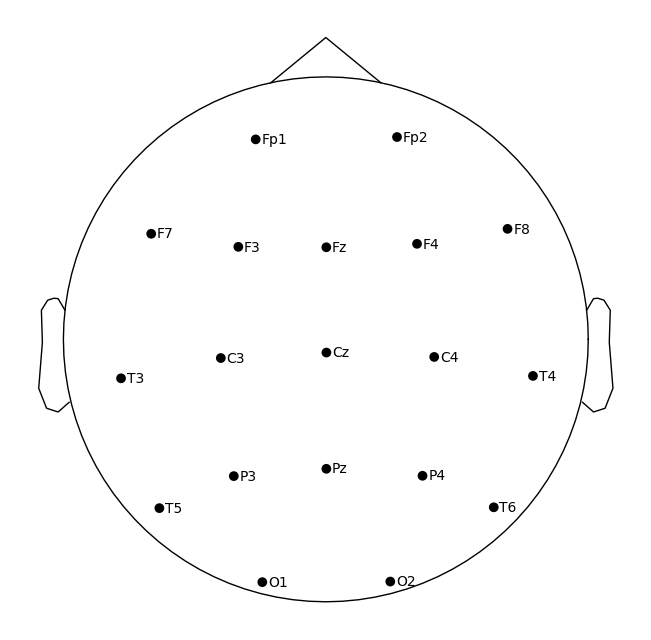

In [16]:
import mne

# Load the .set file
file_path = "/kaggle/input/alzheimerderivatives/sub-001_task-eyesclosed_eeg.set"  # Replace with your actual .set file path
raw = mne.io.read_raw_eeglab(file_path, preload=True)

# Check channel names
print("Channel names:", raw.info['ch_names'])

# Plot the 2D top-down view of electrode locations
raw.plot_sensors(kind='topomap', show_names=True, sphere=0.116);


# Evok plot

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Not setting metadata
95 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 95 events and 2500 original time points ...
0 bad epochs dropped


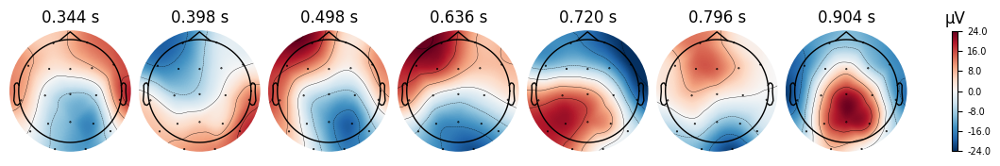

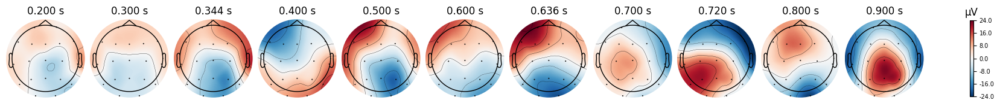

No projector specified for this dataset. Please consider the method self.add_proj.


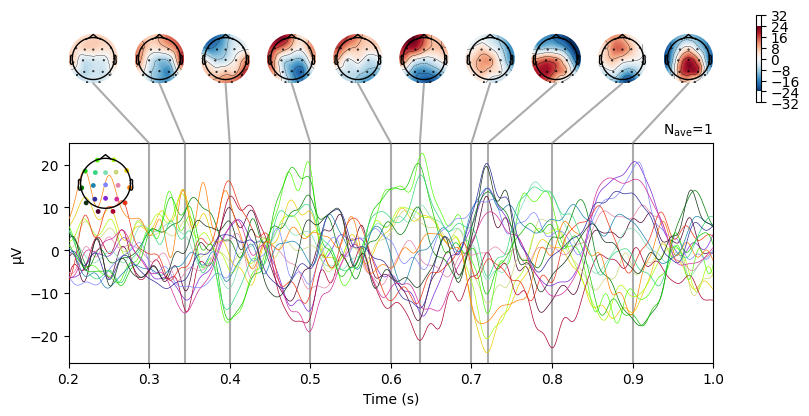

In [17]:
raw = mne.io.read_raw_eeglab('/kaggle/input/alzheimerderivatives/sub-024_task-eyesclosed_eeg.set', preload=True)
raw.pick("eeg")
raw.crop(0, 479.098)  # Crop the dataset to speed up computation taking 9 minutes
raw.set_eeg_reference("average")
# raw.filter(l_freq, h_freq, fir_design='firwin', verbose=False)  # Apply band-pass filter (e.g., alpha band)
    
# Define epoch duration (5 seconds) and create epochs
epoch_duration = 5  # seconds
epochs = mne.make_fixed_length_epochs(raw, duration=epoch_duration, preload= True)

epochs_data= epochs[36].crop(0.2, 1)

# Load your epochs data
evoked = epochs_data.average()  # Compute the evoked response

evoked.plot_topomap(times="peaks");
evoked.plot_topomap(times = np.sort(np.append(np.arange(0.2, 1, 0.1), [0.636, 0.344,0.720])));

# Generate the joint plot
fig =evoked.plot_joint(times = np.sort(np.append(np.arange(0.3, 1, 0.1), [0.636, 0.344,0.720])), show = False);  # Set key time points (adjust based on your data)

# Loop through all text elements in the figure
for text in fig.findobj(plt.Text):
    if any(char.isdigit() for char in text.get_text()):  # Detects numeric labels (time values)
        if "s" in text.get_text():  # Ensures only the topomap time labels are removed
            text.set_visible(False)

plt.show()


EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Not setting metadata
95 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 95 events and 2500 original time points ...
0 bad epochs dropped


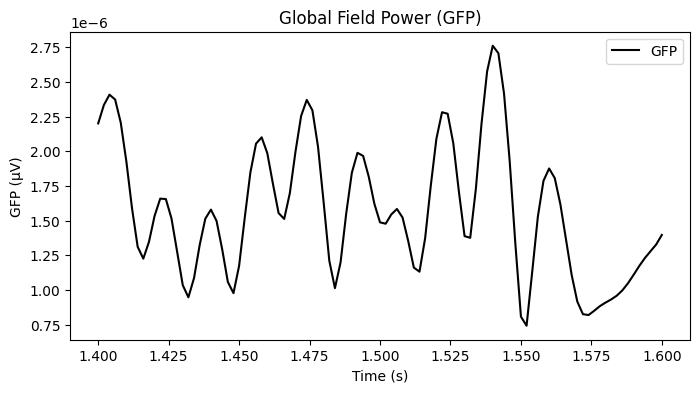

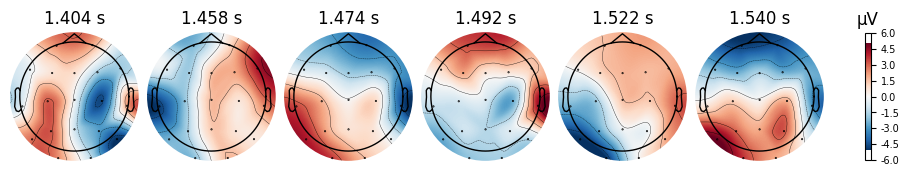

In [18]:
import numpy as np
import matplotlib.pyplot as plt
import mne
from scipy.signal import find_peaks

# Load EEG data
raw = mne.io.read_raw_eeglab('/kaggle/input/alzheimerderivatives/sub-001_task-eyesclosed_eeg.set', preload=True)
raw.pick("eeg")
raw.crop(0, 479.098)
raw.set_eeg_reference("average")
raw.filter(l_freq, h_freq, fir_design='firwin', verbose=False)  # Apply band-pass filter (e.g., alpha band)

# Define epoch duration and create epochs
epoch_duration = 5  # seconds
epochs = mne.make_fixed_length_epochs(raw, duration=epoch_duration, preload=True)

# Select an epoch and compute the evoked response
epochs_data = epochs[0].crop(1.4, 1.6)  # Select epoch and crop to 0.6 sec
evoked = epochs_data.average()

# Compute GFP (Global Field Power)
gfp = evoked.data.std(axis=0)  # Standard deviation across channels

# Find peaks in GFP
peak_indices, _ = find_peaks(gfp, height=np.percentile(gfp, 75))  # Peaks above 75th percentile
peak_times = evoked.times[peak_indices]  # Convert to time values

# Plot GFP
fig, ax = plt.subplots(figsize=(8, 4))
ax.plot(evoked.times, gfp, label="GFP", color='black')
# ax.scatter(peak_times, gfp[peak_indices], color='red', label="Peaks")
ax.set_xlabel("Time (s)")
ax.set_ylabel("GFP (µV)")
ax.set_title("Global Field Power (GFP)")
ax.legend()
plt.grid(False)

# Save GFP plot
plt.savefig("gfp_plot.png", dpi=300, bbox_inches="tight")

# Plot topomaps at GFP peaks
evoked.plot_topomap(times=peak_times, show=False)

# Save topomap figure
# plt.savefig("gfp_topomaps.png", dpi=300, bbox_inches="tight")

plt.show()


EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Not setting metadata
95 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 95 events and 2500 original time points ...
0 bad epochs dropped
No projector specified for this dataset. Please consider the method self.add_proj.


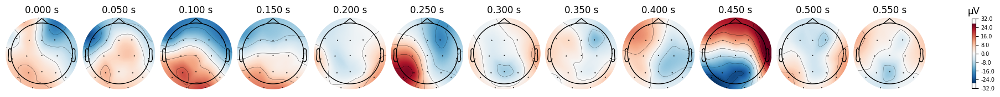

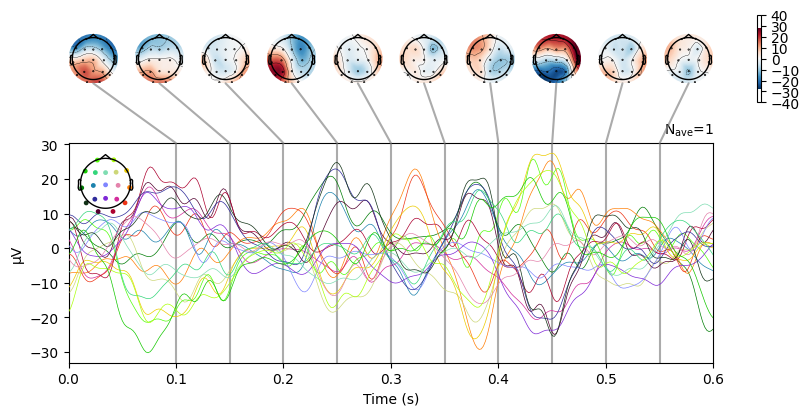

In [19]:
import matplotlib.pyplot as plt

raw = mne.io.read_raw_eeglab('/kaggle/input/alzheimerderivatives/sub-024_task-eyesclosed_eeg.set', preload=True)
raw.pick("eeg")
raw.crop(0, 479.098)  # Crop the dataset to speed up computation taking 9 minutes
raw.set_eeg_reference("average")
# raw.filter(l_freq, h_freq, fir_design='firwin', verbose=False)  # Apply band-pass filter (e.g., alpha band)
    
# Define epoch duration (5 seconds) and create epochs
epoch_duration = 5  # seconds
epochs = mne.make_fixed_length_epochs(raw, duration=epoch_duration, preload= True)

epochs_data= epochs[35].crop(0, 0.6)

# Load your epochs data
evoked = epochs_data.average()  # Compute the evoked response

# evoked.plot_topomap(times="peaks");
evoked.plot_topomap(times = np.arange(0, 0.6, 0.05), show = False);
plt.savefig("topomap_plot.png", dpi=300, bbox_inches="tight")  # Save the figure

# Generate the joint plot without displaying it immediately
fig = evoked.plot_joint(times=np.arange(0.1,0.60,0.05), show=False);

# Loop through all text elements in the figure
for text in fig.findobj(plt.Text):
    if any(char.isdigit() for char in text.get_text()):  # Detects numeric labels (time values)
        if "s" in text.get_text():  # Ensures only the topomap time labels are removed
            text.set_visible(False)

fig.savefig("joint_plot.png", dpi=300, bbox_inches="tight")  # Save as high-quality PNG
plt.show()


EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Not setting metadata
95 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 95 events and 2500 original time points ...
0 bad epochs dropped


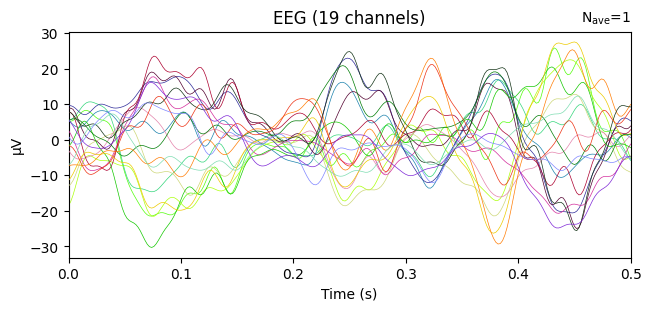

In [20]:
import matplotlib.pyplot as plt

raw = mne.io.read_raw_eeglab('/kaggle/input/alzheimerderivatives/sub-024_task-eyesclosed_eeg.set', preload=True)
raw.pick("eeg")
raw.crop(0, 479.098)  # Crop the dataset to speed up computation taking 9 minutes
raw.set_eeg_reference("average")
# raw.filter(l_freq, h_freq, fir_design='firwin', verbose=False)  # Apply band-pass filter (e.g., alpha band)
    
# Define epoch duration (5 seconds) and create epochs
epoch_duration = 5  # seconds
epochs = mne.make_fixed_length_epochs(raw, duration=epoch_duration, preload= True)

epochs_data= epochs[35].crop(0, 0.5)

# Load your epochs data
evoked = epochs_data.average()  # Compute the evoked response

# # evoked.plot_topomap(times="peaks");
# evoked.plot_topomap(times = np.arange(0, 0.6, 0.05), show = False);
# plt.savefig("topomap_plot.png", dpi=300, bbox_inches="tight")  # Save the figure

# Generate the joint plot without displaying it immediately
fig = evoked.plot(show=False);

# Remove the inset head map (topomap)
for ax in fig.axes:
    if hasattr(ax, 'collections') and len(ax.collections) > 0:  
        ax.remove()

fig.savefig("CAR.png", dpi=300, bbox_inches="tight")  # Save as high-quality PNG
plt.show()


# Ploting EEG data using plotly

In [21]:
pip install mne plotly pandas numpy

Note: you may need to restart the kernel to use updated packages.


In [22]:
import mne

# Load EEG data from a file (example: .edf, .set, .fif)
raw = mne.io.read_raw_eeglab('/kaggle/input/alzheimerderivatives/sub-024_task-eyesclosed_eeg.set', preload=True)
raw.crop(0,15)
# Get data and times
data, times = raw.get_data(return_times=True)  
channel_names = raw.ch_names  # EEG channel names
sfreq = raw.info['sfreq']  # Sampling frequency

import pandas as pd

# Create a DataFrame with EEG channel data
df = pd.DataFrame(data.T, columns=channel_names)
df["Time"] = times  # Add time column

import plotly.express as px

# Convert DataFrame to long format (for Plotly)
df_long = df.melt(id_vars=["Time"], var_name="Electrode", value_name="Amplitude")

# Create faceted line plot
fig = px.line(df_long, x="Time", y="Amplitude", facet_col="Electrode", facet_col_wrap=5, 
              title="EEG Signals for Each Electrode", color="Electrode")

fig.show()


# Loading Patients

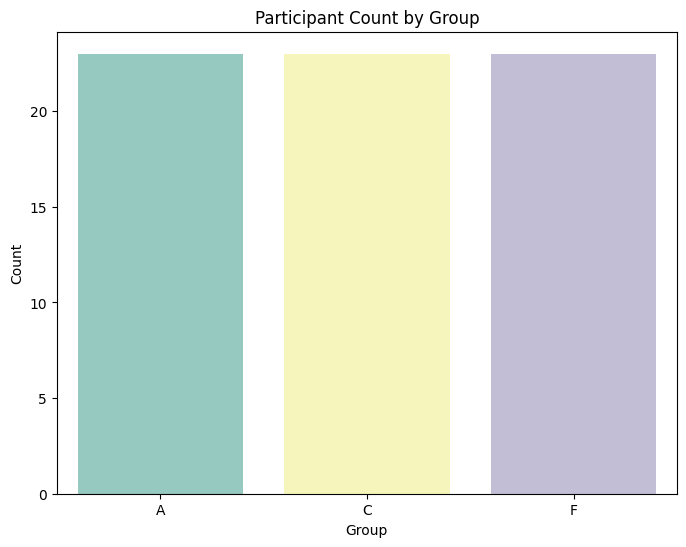

In [23]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the TSV data
data = pd.read_csv("/kaggle/input/tsv-equal/participants_equal.tsv", sep="\t")

# Bar chart: Participant count by Group
plt.figure(figsize=(8, 6))
sns.countplot(x='Group', data=data, palette='Set3')
plt.title('Participant Count by Group')
plt.xlabel('Group')
plt.ylabel('Count')
plt.show()

In [24]:
# # Save each DataFrame as a CSV file
data.to_csv('tsv_equal.csv', index=False)

In [25]:
df = data.copy()

In [26]:
grouped = df.groupby(['Group', 'Gender']).size().unstack(fill_value=0)
grouped

Gender,F,M
Group,,
A,13,10
C,8,15
F,9,14


## Gender Distribution by group

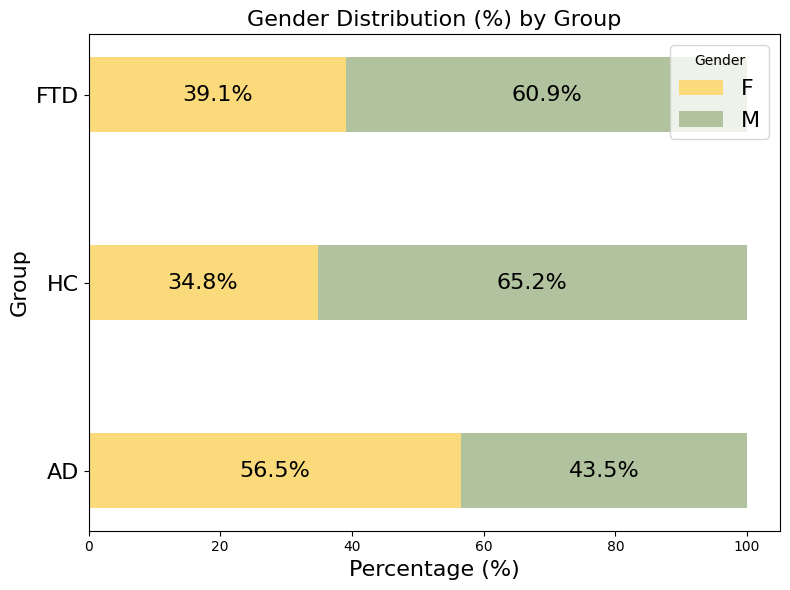

In [27]:
import pandas as pd
import matplotlib.pyplot as plt

# Calculate percentage distribution of gender for each label
grouped = df.groupby(['Group', 'Gender']).size().unstack(fill_value=0)
percentages = grouped.div(grouped.sum(axis=1), axis=0) * 100

# Prepare data for plotting
labels = percentages.index
labels_custom = ['AD', 'HC', 'FTD']  # Custom labels for groups
genders = percentages.columns

# Initialize the plot
fig, ax = plt.subplots(figsize=(8, 6))
bottom = [0] * len(labels)
bar_height = 0.4  # Adjust bar width

# Define colors for genders
colors = {'M': '#B1C29E', 'F': '#FADA7A'}

# Create stacked bars
for gender in genders:
    ax.barh(labels_custom, percentages[gender], label=gender, color=colors.get(gender, 'black'), height=bar_height, left=bottom)
    bottom = [i + j for i, j in zip(bottom, percentages[gender])]

# Add percentage text inside the bars
for i, group in enumerate(labels):
    cumulative = 0
    for gender in genders:
        value = percentages.loc[group, gender]
        if value > 0:  # Avoid displaying text for 0%
            ax.text(
                cumulative + value / 2, i, f'{value:.1f}%',
                ha='center', va='center', fontsize=16, color='black'
            )
        cumulative += value

# Add labels, legend, and title
ax.set_title('Gender Distribution (%) by Group', fontsize=16)
ax.set_xlabel('Percentage (%)', fontsize=16)
ax.set_ylabel('Group', fontsize=16)
ax.tick_params(axis='y', labelsize=16)  # Increase font size for y-axis ticks
ax.legend(title='Gender', loc='upper right',fontsize=16)
# Disable grid lines
ax.grid(False)
plt.tight_layout()

plt.savefig('Gender Distribution by group', dpi=300, bbox_inches='tight')  # Save as a high-resolution image

# Show the plot
plt.show()


## Boxplot of Age by Group

In [28]:
data

,participant_id,Gender,Age,Group,MMSE
0,sub-001,F,57,A,16
1,sub-002,F,78,A,22
2,sub-004,F,67,A,20
3,sub-005,M,70,A,22
4,sub-006,F,61,A,14
...,...,...,...,...,...
64,sub-084,F,71,F,24
65,sub-085,M,64,F,26
66,sub-086,M,49,F,26
67,sub-087,M,73,F,24


In [29]:
df = data.copy()
# Rename groups A, C, F to AD, HC, and FTD respectively
df['Group'] = df['Group'].replace({'A': 'AD', 'C': 'HC', 'F': 'FTD'})


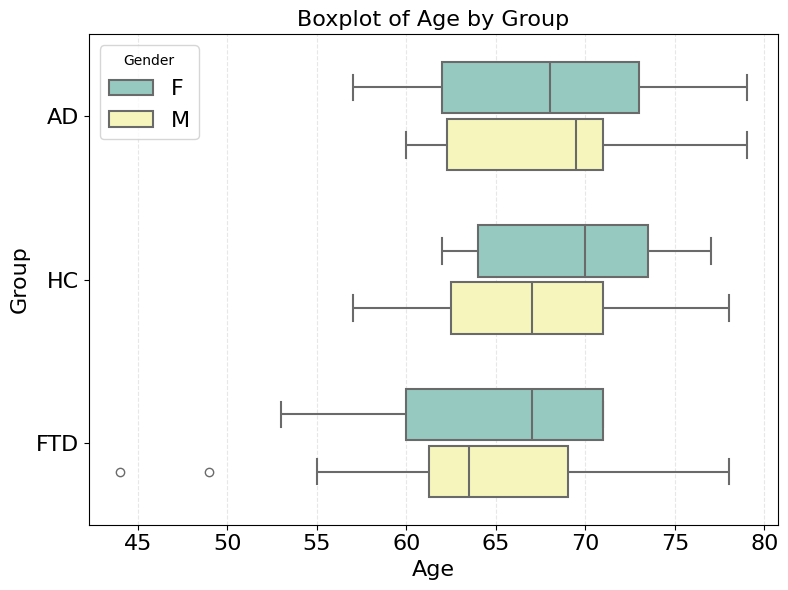

In [30]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a boxplot using seaborn
plt.figure(figsize=(8, 6))
sns.boxplot(data= df ,x='Age', y='Group',hue = "Gender", palette='Set3', width=0.7, linewidth=1.5, gap = 0.1)

# Add titles and labels
plt.title('Boxplot of Age by Group', fontsize=16)
plt.xlabel('Age', fontsize=16)
plt.ylabel('Group', fontsize=16)
plt.tick_params(axis='x', labelsize=16)  # Increase font size for y-axis ticks
plt.tick_params(axis='y', labelsize=16)  # Increase font size for y-axis ticks
plt.grid(axis='x', linestyle='--', alpha=0.3)
plt.legend(title='Gender', loc='upper left',fontsize=16)

plt.tight_layout()

plt.savefig('Boxplot of Age by Group Genderwise', dpi=300, bbox_inches='tight')  # Save as a high-resolution image

plt.show()
 

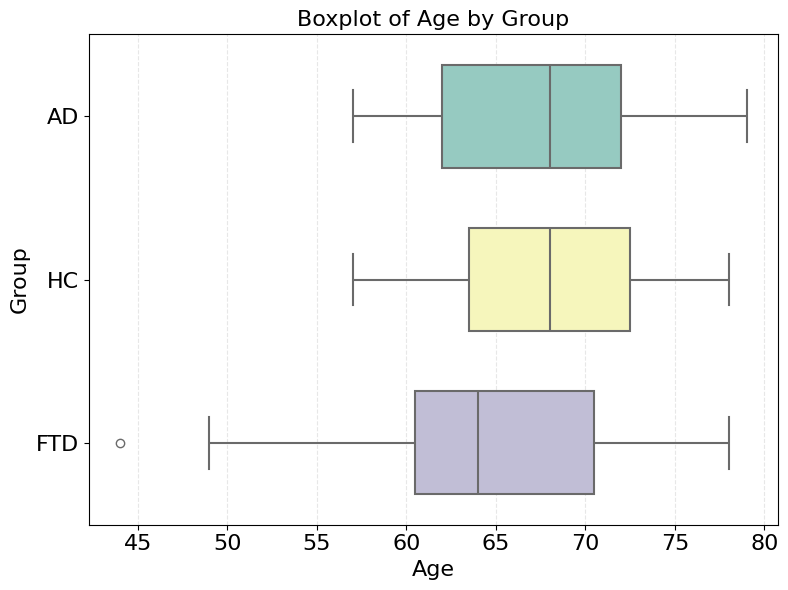

In [31]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a boxplot using seaborn
plt.figure(figsize=(8, 6))
sns.boxplot(data= df ,x='Age', y='Group', palette='Set3', width=0.7, linewidth=1.5, gap = 0.1)

# Add titles and labels
plt.title('Boxplot of Age by Group', fontsize=16)
plt.xlabel('Age', fontsize=16)
plt.ylabel('Group', fontsize=16)
plt.tick_params(axis='x', labelsize=16)  # Increase font size for y-axis ticks
plt.tick_params(axis='y', labelsize=16)  # Increase font size for y-axis ticks

plt.grid(axis='x', linestyle='--', alpha=0.3)

plt.tight_layout()

plt.savefig('Boxplot of Age by Group', dpi=300, bbox_inches='tight')  # Save as a high-resolution image

plt.show()
 

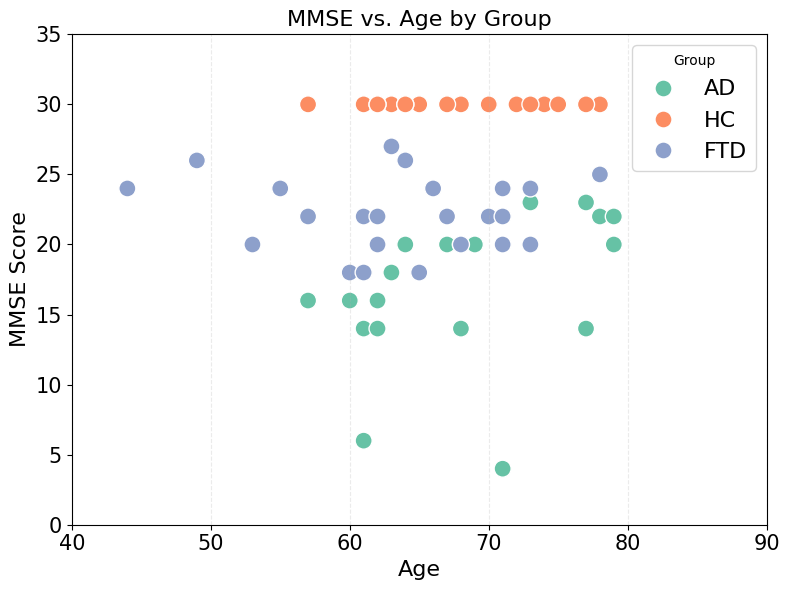

In [32]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Age', y='MMSE', hue='Group',
                # style='Gender', 
                # markers={'M': '*', 'F': 'X'},
                data=df, palette='Set2', s= 150)
plt.title('MMSE vs. Age by Group',fontsize=16)
plt.xlabel('Age',fontsize=16)
plt.ylabel('MMSE Score', fontsize=16)
plt.legend(title='Group')
plt.tick_params(axis='x', labelsize=15)  # Increase font size for y-axis ticks
plt.tick_params(axis='y', labelsize=15)  # Increase font size for y-axis ticks
plt.legend(title='Group', loc='upper right',fontsize=16)
plt.grid(axis='x', linestyle='--', alpha=0.25)

# Set x-axis limits
plt.ylim(0, 35)
plt.xlim(40,90)

plt.tight_layout()

plt.savefig('MMSE vs Age by group', dpi=300, bbox_inches='tight')  # Save as a high-resolution image

plt.show()